## ProjectScraping Youtube content and recommendations, based on a search term 
Lukas Weixler

23.02.2019

### Introduction

Several people in the US have already analyzed Youtube's potential to direct towards polarized topics with its search results and recommendations.

This is just one example:
https://www.theguardian.com/technology/2018/feb/02/youtube-algorithm-election-clinton-trump-guillaume-chaslot

In this project, I attempt to analyze the debate on the Migration-Compact, which was largely held online on facebook and twitter, but also on Youtube. Thereby, the following questions come up:

1) Was the debate noticable on Youtube (Postings, Likes, Comments Views etc.)?

2) What were the main keywords in the debate? 

3) Did each side in this debate get the same amount of attention?

4) Does Youtube equally recommend other videos, or are recommendations largely reduced to a few videos? 

While I progressed with the project, additional questions came up, which mainly concern the Youtube Search Algorithm:

5) What kinds of videos are recommended?

6) Following long queues of videos, recommendations and so forth - what topic am I likely to end up at?


Since the demand for answering each question largely varies, I have split the project into three parts, ordered by demand. The third part is only slightly working, which is why I consider part 1 and 2 as the turned in project. The third part is more of an outlook on what I would do next.

- Part 1 considers Question 1 to 3, where I use the Youtube API to extract IDs and details about results, if I would enter the search term 'Migrationspakt'.

- Part 2 considers Question 4, where I look for recommended videos and compare them, regarding their in-degree-centrality.

- Part 3 considers Question 5 and 6, where I have actually built a working function to retreive data of the recommended video IDs, paired with their degree centrality in one dataset. Furthermore I present an attempt to recursively iterate through lists of recommendations multiple times. Unfortunately, the API kicked me out due to quota overlow. Otherwise, this might have worked.

## Part 0 - Preparations

### Importing all required packages

Since I am working on a variety of tasks in this project, i need a bunch of package imports, which are collected at this point to avoid duplicates later on.

In [2]:
#Text Analysis
import re
import string
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
import requests
from collections import Counter
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

# Date Parsing
import isodate
from dateutil.parser import parse
import datetime

# Data Visualization
import seaborn as sns
sns.set(style = 'whitegrid')
import pandas as pd
import matplotlib.pyplot as plt
from pprint import pprint
import networkx as nx

# Saving Data
import json
import csv

# API Communication
import sys
from apiclient.discovery import build
from apiclient.errors import HttpError
from time import sleep

### Installing external libraries

Several packages required me to install and upgrade external libraries before installation, which are listed below.


In [ ]:
!pip install python-twitter
!pip install isodate
!pip install networkx
!pip install --upgrade networkx
!pip install wordcloud
!pip install --upgrade google-api-python-client
!pip install --upgrade google-auth google-auth-oauthlib google-auth-httplib2

### My API-Key

Scraping on Youtube Videos requires an API Key, since we are communicating with an API server. This requires a Google account as well as Accesss to the API library: https://console.developers.google.com/apis/library?project=scraping-232414. Thereby, I need the YouTube Data API v3, which I can search in the provided field. Below, I am storing the API Key at one assigned place, in case I need to replace it. 

In [689]:
api_key = 'insert my private api here'

## Part 1 - Scraping and analyzing Video IDs and Information by Search Result

### Building a Basic ID Scraper

First of all, I build a function to get a list of Video IDs, for videos which would pop up, if we entered a certain search term into Youtube. At Maximum, I am able to do 50 calls at once, which means, that I must also build an iterator later. Here, I am just interested in building a function, that gets me the first 50 Youtube IDs. The resulting list is thereby sorted by date and a marker (token) is set at the last video, for the iterator to know, where to start the call next. 

Originally, this function was designed to go through all pages with a while loop and an exception handler. Nevertheless, I had the experience of infinite loops with this method, therefore I specified the number of iterations in a separate function. 



In [690]:
def youtube_search(q, max_results=50,order="date", token=None):  
    youtube = build('youtube', 'v3',
        developerKey=api_key)
    #defining how the search result is to be stored
    search_response = youtube.search().list(
        q=q,
        type="video",
        
        #Set a marker after the 50 Video-Portion
        pageToken=token,
        
        #Order, in which the results come in
        order = order,
        
        #I just want to store the ID
        part="id",
        
        #To be adjusted in between 1-50
        maxResults=max_results
        ).execute()
    
    videos = []
    #Exception Handling - taken from (https://github.com/spnichol/youtube_tutorial/blob/master/youtube_videos.py) 
    for search_result in search_response.get("items", []):
        if search_result["id"]["kind"] == "youtube#video":
            videos.append(search_result)
    try:
        #Go to next portion of 50 Videos
        nexttok = search_response["nextPageToken"]
        return(nexttok, videos)
    except Exception as e:
        #If token has arrived at last page, finish. 
        nexttok = "last_page"
        return(nexttok, videos)

### Function to get all search Results

The search through all Youtube Videos, not just the first 50 requires a loop of calls, since one call can only get 50 Results in Maximum, but for sure, there are more than 50 Videos out for almost every search term, one could think of...

Below I have defined a function to get me all Video IDs, which would pop up at a certain search term. Thereby I used the function above as a basis and then built an iterator around it. The function input requires also an explicit enumeration of rounds to be taken, since I had bad experiences of infinite loops when I just ran the 'youtube-search' function, based on its exception handler 'last page'.

In [691]:
#Function with Search Term and Number of Iterations
def longsearch(term, max):
    
    #Storage for Videos
    fulldict = []
    
    #temporary storage for current result
    test = youtube_search(term)
    
    #append current result to Storage
    fulldict.append(test)
    
    #Condition of repetition - until iteration nr is reached
    while len(fulldict) < max:
        
        #First Element in previous Result used as a marker
        token = test[0]
        
        #Storing next Result temporarily
        test = youtube_search(term, token = token)
        
        # Append next result to Storage
        fulldict.append(test)
        
        #Break for the Server
        sleep(1)
        
    return fulldict

### Executing the function
Now I can use the function for my required search term 'Migrationspakt', for which we will iterate 15 times. This will be enough to retreive all videos.

In [12]:
full = longsearch('Migrationspakt', 15)

### Flatten list of Results and only display IDs
There are two things, I need to clear before this dataset is usable for further requests and analysis: 

1) There are not only video IDs, but also other informations about the video, which I won't need for analysis. I want a plain dataset of only Video IDs.

2.) The list is still nested into its 50-units portions, due to the function and the iteration above. I need to flatten this list to one level.

Therefore, I have created the function 'scaledown', getting the dataset as the only input, which takes care of both tasks.

In [552]:
#Enter previous Dataset
def scaledown(dataset):
    
    #Create new Storage
    truelist = []
    
    #Iterate through each of the Rounds
    for elem in dataset:
        trueelem = elem[1]
        
        #Iterate through each of the 50 results
        for i in trueelem:
            
            #Only aim for the Video ID
            truelist.append(i['id']['videoId'])
    return truelist


#Usage of the Function, storing the results in 'truelist'
truelist = scaledown(full)
    


### Checking the Length of the Queried Results

The result means, we have actually retreived 550 Video Results through our Term 'Migrationspakt.

In [93]:
print(len(truelist))

550


### Ids to dataframe

In case it is necessary, I store the ID List in a pd.dataframe and save it as a csv on my drive.

In [16]:
#Converting my ID List to a pandas dataframe
truelist_pd = pd.DataFrame(truelist)

#Store Dataframe as csv on my drive
truelist_pd.to_csv('truelist.csv', 
            encoding = 'utf-8',
            index = True)

###### Remark 

Saving the IDs in the beginning of February actually helped me a lot during the last two days, since I got in trouble with the Google API Quota Limit of 10000 Units per day. Due to my saving, I was able to simply call the CSV and keep working, saving me a lot of Google-quota and time.

In [463]:
#Code to import the stored csv as pandas
first_results = pd.read_csv('truelist.csv',
                encoding = 'utf-8')

In [91]:
#Convert the Pandas Dataframe back to a List
truelist = first_results['0'].values.tolist()

### Iterator to get relevant Video Information

So far, I have only requested simple Video IDs, which of course don't provide much information. These IDs are nevertheless Keys, through which we can get a bunch of interesting information about the Videos. Especially Titles, Descriptions, Tags, and Channel IDs (available in 'Snippet'), the Duration (available in 'items'), the likes, comments and views (available in 'Statistics') as well as the publication date make up quite valuable information about the video are worth storing. In this project I definitely won't be able to use all of these results in this project, but I might in the future.

Therefore all of the information mentioned above is requested and pulled into a list via the call below, using the existing Keys from my Id-List 'truelist'.

In [692]:
#function to request data related to a video_id list
def pull_descriptions(lst):
    
    #final list to store the results
    descriptions = []
    
    #setup communication with the api, entering my api_key
    youtube = build('youtube', 'v3', developerKey=api_key)

    #iterate over each id in the id-list
    for ident in lst:  
        
        #request content Details, Description, Channel Title and Tags, details mentioned above
        video_response = youtube.videos().list(
        id=ident,
        part='snippet,contentDetails,statistics'
        ).execute()
        
        #append the result to the final list
        descriptions.append(video_response)
    
    return descriptions

In [ ]:
# Executing the function and saving the result
descriptions = pull_descriptions(truelist)

### An exemplary result by the call of one ID (out of 550 in the list) 

Below, I have displayed the basic strucure of the newest unit of retreived data. It becomes obvious, that I must flatten the entire dataset, to somehow get the chance of analyzing this data.

In [696]:
pprint(descriptions[0])

{'etag': '"XpPGQXPnxQJhLgs6enD_n8JR4Qk/WIJ0nTY73kyRcE-V7g65agn7aZw"',
 'items': [{'contentDetails': {'caption': 'false',
                               'definition': 'hd',
                               'dimension': '2d',
                               'duration': 'PT4M13S',
                               'licensedContent': False,
                               'projection': 'rectangular'},
            'etag': '"XpPGQXPnxQJhLgs6enD_n8JR4Qk/zeJlHmv0jdCHJT-MIaCf_TD_CTw"',
            'id': '9jdwwCKLu_s',
            'kind': 'youtube#video',
            'snippet': {'categoryId': '25',
                        'channelId': 'UCdQ3tHuZSA5IJzhLnyBMySg',
                        'channelTitle': 'Parteienallianz 2',
                        'description': 'Besuchen Sie auch unseren Presseblog '
                                       'http://staseve.eu',
                        'liveBroadcastContent': 'none',
                        'localized': {'description': 'Besuchen Sie auch '
                

### Empty Element

I actually found one Video with no information at all. It might have been deleted between calling IDs and calling Video information. Below, I have displayed the result. Since it cannot provide any information and makes preparing the data much harder, I will sort it out before data preparation.

In [123]:
print(descriptions[64])

{'kind': 'youtube#videoListResponse', 'etag': '"XpPGQXPnxQJhLgs6enD_n8JR4Qk/ftqcoEi5lFrDLEyLbPZCiTrEzXU"', 'pageInfo': {'totalResults': 0, 'resultsPerPage': 0}, 'items': []}


In [124]:
#del descriptions[64]

### Checking retreived data

With the exception of the one empty Video Key, the list of IDs (truelist) and the list of Video Information (descriptions) should have equal length. The test below confirms this assumption.

In [709]:
print(len(descriptions))
print(len(truelist))

549
550


### Flatten the retreived data

The exemplary result above makes obvious, that I have to do some data-cleaning. Also, I don't need all of the results, which is why I only included these elements in the new dataset, which I thought, would be worth keeping for analysis. As mentioned before, I won't be able to analyze every single variable in this project, but I might in the future.

Among all retreived video-data, I decided to keep the the title, the description, the duration in seconds, the video Id, the category (Youtube categorizes its videos by topic - check out the youtube category Id list: https://gist.github.com/dgp/1b24bf2961521bd75d6c), by channel title, by channel Id, the time of publication (date, month, week and weekly timing seperated), the number of views, comments, likes and dislikes, as well es the tags. Tags are to be filled out by the uploader, while publishing the video. Not all of the users do that, which is why I also had to place an exception handler for empty tag fields. Exception handling was also needed for likes, dislikes and comments, since not all of them actually have something to show there. 

Before actually writing the flattening function, I have to write another function in advance, preparing me the tags for analysis. Later, I might extend this previous function to titles and descriptions, but for now, preparing and analyzing tags is enough.

In [398]:
#Write a Function to get the Tags in Lowercase and get rid of punctuation
def lower_list(lst):
    
    #final list for the results
    lowerlist = []
    for i in lst:
        
        #get rid of any punctuation in a string
        translator = str.maketrans('', '', string.punctuation)
        nostring = i.translate(translator)
        
        #convert the words to lowercase
        lowerlist.append(nostring.lower())
    return lowerlist

In [693]:
#Write a Function to clean the retreived list of youtube descriptions
def order_vids(inp):
    #final list for results to be appended
    parse_list=[]
    
    #iterate over earch element in retreived list
    for i in inp:
        
        #create new dictionary to be filled with values below and appended to final list
        parse_dict = {}
        
        # get the video title
        parse_dict['Video Title'] = i['items'][0]['snippet']['localized']['title']
        
        # get the video description - a longer text under each Video
        parse_dict['Video Description'] = i['items'][0]['snippet']['description']
        
        # get the video duration in seconds
        parse_dict['Duration']= isodate.parse_duration(i['items'][0]['contentDetails']['duration']).total_seconds()
        
        # get the Id number also into this dataframe
        parse_dict['Video Id']= i['items'][0]['id']
        
        # get the video category. Youtube categorizes its videos by topic
        parse_dict['Category'] = i['items'][0]['snippet']['categoryId']
        
        # get the channel title
        parse_dict['Channel Title'] = i['items'][0]['snippet']['channelTitle']
        
        # get the channel Id
        parse_dict['Channel Id'] = i['items'][0]['snippet']['channelId']
        
        # get the date of publication
        parse_dict['Published Day'] = parse(i['items'][0]['snippet']['publishedAt']).strftime('%Y-%m-%d')
        
        # get the month of publication
        parse_dict['Published Month'] = parse(i['items'][0]['snippet']['publishedAt']).strftime('%Y-%m')
        
        # get the week of publication
        parse_dict['Published Week'] = parse(i['items'][0]['snippet']['publishedAt']).strftime('%Y-%m %U')
        
        # get the weekday and hour of publication
        parse_dict['Published Time'] = parse(i['items'][0]['snippet']['publishedAt']).strftime('%a %H')
        
        # get the number of views in integer format
        parse_dict['Views'] = int(i['items'][0]['statistics']['viewCount'])
        
        #get the number of comments in integer format
        try:
            parse_dict['Comments Count'] = int(i['items'][0]['statistics']['commentCount'])
        # if there is no comment, python will fail. Therefore I do exception handling
        except KeyError:
            parse_dict['Comments Count'] = 0
        
        #get the number of likes in integer format
        try:
            parse_dict['Likes Count'] = int(i['items'][0]['statistics']['likeCount'])
        # if there is no like, python will fail. Therefore I do exception handling
        except KeyError:
            parse_dict['Likes Count'] = 0
        
        #get the number of dislikes in integer format
        try:
            parse_dict['Dislikes Count'] = int(i['items'][0]['statistics']['dislikeCount'])
        # if there is no dislike, python will fail. Therefore I do exception handling
        except KeyError:
            parse_dict['Dislikes Count'] = 0
        
        #get the list of tags for each video
        try:
            parse_dict['Tags'] = lower_list(i['items'][0]['snippet']['tags'])
        # if there is no tag, python will fail. Therefore I do exception handling
        except KeyError:
            parse_dict['Tags'] = []
            
        #append all results to the final list
        parse_list.append(parse_dict)
    
    return parse_list

### Use the function to flatten the retreived dataset
The new dataset is stored as 'newset'

In [400]:
newset = order_vids(descriptions)

### An exemplary result of cleaned elements
Below, the same unit as above is shown in cleaned format. Except for the tags, no second level is included anymore, which means, that we can perceed to analysis.

In [702]:
pprint(newset[0])

{'Category': '25',
 'Channel Id': 'UCdQ3tHuZSA5IJzhLnyBMySg',
 'Channel Title': 'Parteienallianz 2',
 'Comments Count': 3,
 'Dislikes Count': 0,
 'Duration': 253.0,
 'Likes Count': 22,
 'Published Day': '2019-02-15',
 'Published Month': '2019-02',
 'Published Time': 'Fri 12',
 'Published Week': '2019-02 06',
 'Tags': ['migrationspolitik',
          'flüchtlingspolitik',
          'migration',
          'armut',
          'reichtum',
          'gesellschaft',
          'asien',
          'afrika',
          'amerika',
          'lateinamerika',
          'europa',
          'menschen',
          'wirtschaft',
          'sklaven',
          'angela merkel',
          'gutmenschen',
          'george soros'],
 'Video Description': 'Besuchen Sie auch unseren Presseblog http://staseve.eu',
 'Video Id': '9jdwwCKLu_s',
 'Video Title': 'Warum der Migrationspakt und die Migrationspolitik die Welt '
                'nicht retten können',
 'Views': 142}


### Processed Data to Dataframe

Since I am finished processing my initial layer of search results, I can save it as a pandas Dataframe in order to conduct some basic Analysis on it. Also I save a csv file of it on my Drive.

In [703]:
#Convert to Pandas Dataframe
newset_pd = pd.DataFrame(newset)

In [704]:
#Save as CSV File

newset_pd.to_csv('newset.csv', 
            encoding = 'utf-8',
            index = True)

### Analyze the Frequency of Postings

To get a broad Overview, we might first look at the development of postings over time. Therefore I create a histogram, showing me the frequency of posts by day. As can be seen, the publication frequency dependent on days is quite inconsistent, displaying three days with more than 20 publications, alternating with five or less per day in the same time period. Nevertheless, what we can see, is that the frequency of postings got a real kickstart at Nov-31, keeping several daily publications up almost until christmas. This year, the number of publications remarkably dropped. 

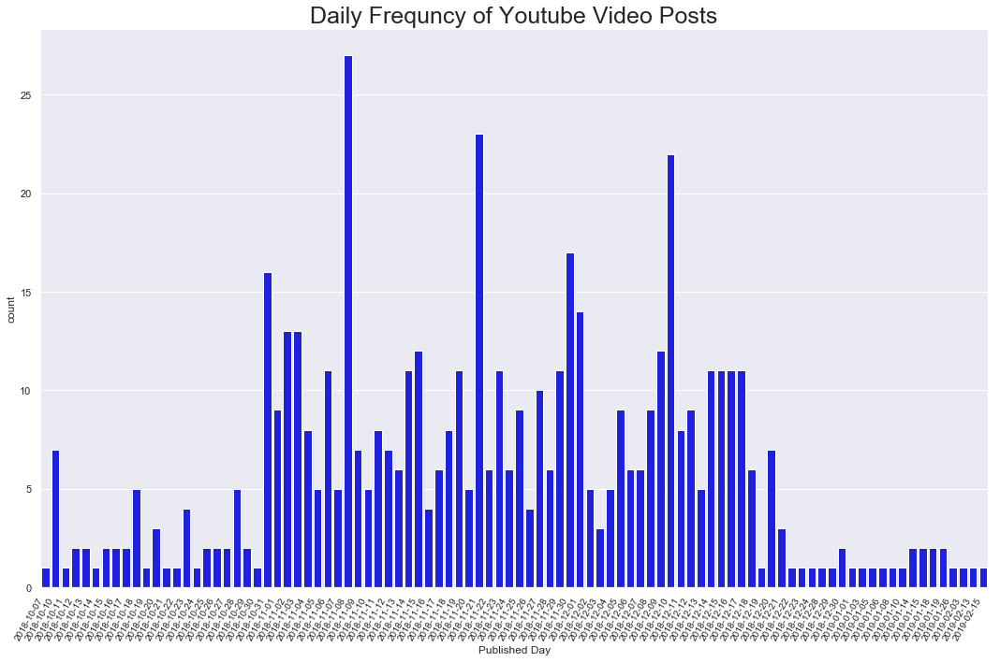

In [705]:
#setup size and style
plt.figure(figsize=(15,10))
sns.set(style="darkgrid")

#plot by day of publication, sort bars by increasing time
ax = sns.countplot(x="Published Day",color = 'blue', data=newset_pd, order = sorted(set(newset_pd["Published Day"])))

#make the x labels readable
ax.set_xticklabels(ax.get_xticklabels(minor = True, which = 'both'), rotation=60, ha="right", fontsize = 10)

#write a title
ax.set_title('Daily Frequncy of Youtube Video Posts', fontsize = 25)

#display the plot
plt.tight_layout()
plt.show()

### Analyze the Categories

It might me interesting to know, under which Youtube-Categories the results are listed. Youtube therefore uses a list of approx. 45 Categories, which classify the video, depending on its content. 
Check it out here: https://gist.github.com/dgp/1b24bf2961521bd75d6c I decided to leave the categories at its number for now.

Brief introduction to the categories:
Most important are Categories 25 (News&Politics), 22 (People&Blogs), and 29 (Nonprofits and Activism) Also note the single pop ups of Categories 23 (Comedy) and 24 (Entertainment) in November 2018 - in the month when this topic was quite central in news coverage.

Comparing this plot with the one above releives an interesting fact: While the publication rate of all videos kickstarted at oct-31, the publication rate of politically categorized videos (25) had no such kickstart, but rather increased step by step.

###### Analysis by Calendar Week

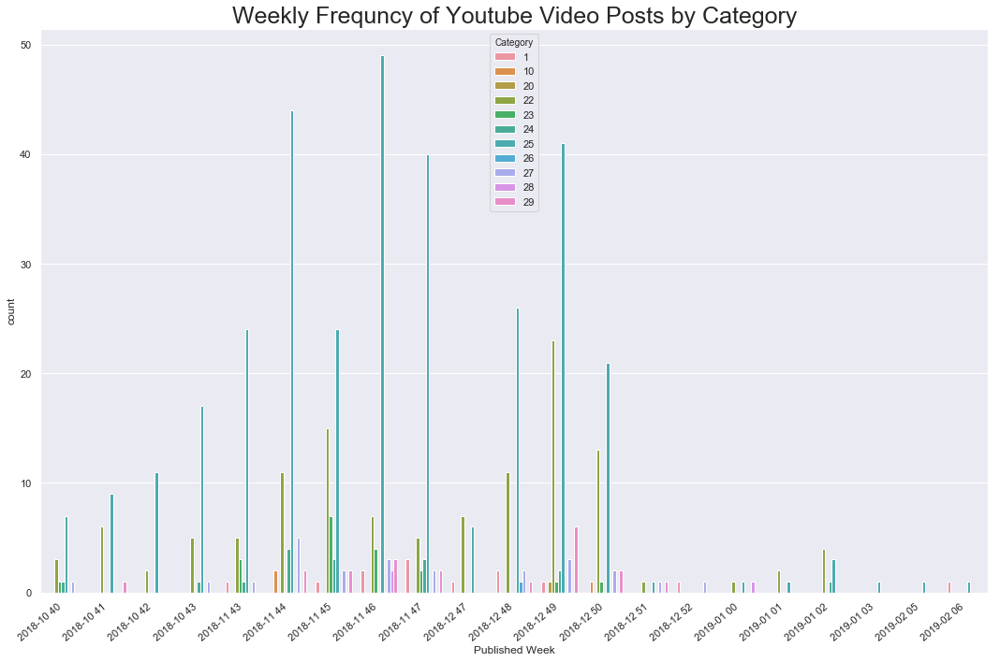

In [252]:
#setup size and style
plt.figure(figsize=(15,10))
sns.set(style="darkgrid")

#plot by week of publication, seperate color by video category, sort bars by increasing time
ax = sns.countplot(x="Published Week", hue = "Category", data=newset_pd, order = sorted(set(newset_pd["Published Week"])))

#make the x labels readable
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

#write a title
ax.set_title('Weekly Frequncy of Youtube Video Posts by Category', fontsize = 25)

#display the plot
plt.tight_layout()
plt.show()

### Analysis by Month

To get a more satisfying view of the entire distribution among the categories, I reduce the level towards months. Thereby, the core of the debate in november becomes quite obvious.

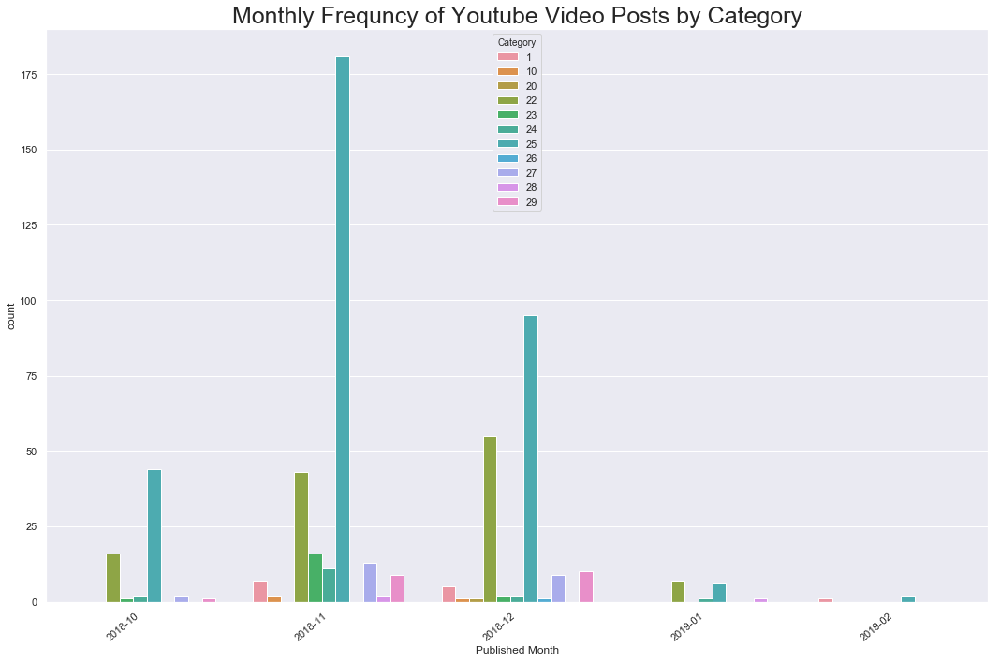

In [254]:
#setup size and style
plt.figure(figsize=(15,10))
sns.set(style="darkgrid")

#plot by month of publication, seperate color by category, sort bars by increasing time
ax = sns.countplot(x="Published Month", hue = "Category", data=newset_pd, order = sorted(set(newset_pd["Published Month"])))

#make the x labels readable
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

#write a title
ax.set_title('Monthly Frequncy of Youtube Video Posts by Category', fontsize = 25)

#display the plot
plt.tight_layout()
plt.show()

### Likes and Comments by Views

Furthermore, I want to get an overview of likes, comments and views. Therefore, I use a scatterplot, also to display the relationship, these variables have among each other. As can be estimated, views, comments and likes are positively related to each other. Note, that we have some dozens of videos, having more than 100000 views, while the majority remains below 50000.

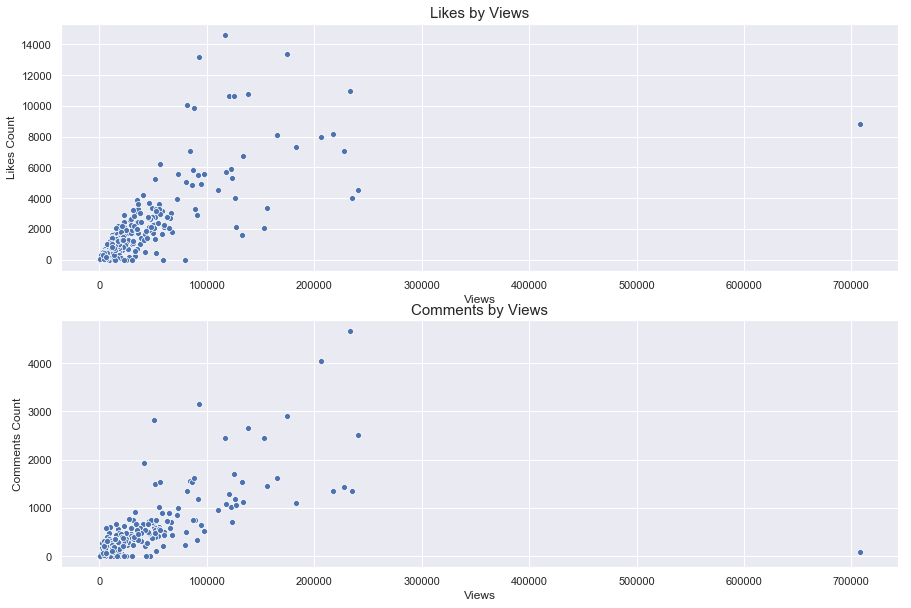

In [317]:
# Setup two rows of plots and a large figure size
fig, axs = plt.subplots(2,1, figsize=(15,10))

#create the first scatterplot with likes by views
ax = sns.scatterplot(x = 'Views', y = 'Likes Count', data = newset_pd, ax = axs[0])
ax.set_title('Likes by Views', fontsize = 15)

#create the second scatterplot with comments by views
ax1 = sns.scatterplot(x = 'Views', y = 'Comments Count', data = newset_pd, ax = axs[1])
ax1.set_title('Comments by Views', fontsize = 15)

#display the plot
plt.show()

### Videos with  Views > 100000

In order to know, what were these videos of 100000 or more views, I extracted the appropriate items from my cleaned dataset, to briefly list the titles of the videos. This shall serve as a basic impression for now.

In [337]:

# List of videos with more than 100.000 Views
large_vids = []

# Iterate over my clean dataset
for i in newset:
    
    # Pick out the videos with more than 100.000 Views
    if i['Views'] > 100000:
        large_vids.append(i)

# Sorting the Videos by number of Views        
large_vids = sorted(large_vids, key = lambda x: x['Views'], reverse = True)



In [326]:
print(len(large_vids))

24


### Ranking of most watched Video titles, found by the term 'Migrationspakt'

I print each video's views as well as its title. The one top video, having by far the most views is created by the ultra-nationalist fraction in the EU parliament and uploaded by 'AFD Kompakt' TV. Below there seem to be more neutral videos at first sight. 

In [338]:
for i in large_vids:
    print(i['Views'], '|', i['Video Title'])

708425 | UN-Migrationspakt | Meuthen – Der EFDD-Europa-Talk aus Straßburg
240582 | UN-Migrationspakt und rechtspopulistische Verschwörungstheorien | heute-show vom 30.11.2018
234739 | UNO-Migrationspakt – eine Frage der Perspektive
233685 | Der Migrationspakt neutral erklärt
227514 | Migrationspakt der Eliten (JF-TV Reportage)
217080 | Alexander Gauland zum Migrationspakt, Bundeshaushalt 2019
206547 | UN-Migrationspakt erklärt von MICHAEL KUHR | KUHR SECURITY GmbH Berlin
182869 | Der UN-Migrationspakt und das Grundgesetz
174660 | Migrationspakt beschlossen-Kriegserklärung gegen unser Volk
165447 | #Migrationspakt - Wie gefährlich ist der Migrationspakt?
156289 | Wirtschaft oder Politik – Wer wirklich hinter dem UN-Migrationspakt steht [DFP08]
153054 | UN-Migrationspakt: Hitzige Debatte im Bundestag
137797 | UN Migrationspakt – Es werden Millionen sein…
133574 | Migrationspakt - das geplante Morden?
132462 | Unionspolitiker Harbarth und AfD-Frau von Storch liefern sich Schlagabtausch üb

### Tags

Moving back to the large dataset, I am interested in the general distribution of topics among all videos. Therefore, I get the Tags into a List and display the most important ones. The distribution of tags interestingly shows at some points the focus of discussion: 'afd', 'flüchtlinge', 'merkel'. Appearently, this debate was also largely happening in Austria as well.

In [403]:

# Iterate through 'Tags' in the pandas dataframe of my clean dataset, aiming fore most common 25 words
d = Counter(newset_pd['Tags'].sum()).most_common(25)
count = pd.DataFrame([d]).T
print(count)

                          0
0     (migrationspakt, 289)
1                (afd, 152)
2          (migration, 134)
3            (politik, 122)
4        (flüchtlinge, 117)
5    (unmigrationspakt, 93)
6         (deutschland, 92)
7                  (un, 90)
8              (merkel, 78)
9         (nachrichten, 72)
10          (bundestag, 67)
11                (uno, 59)
12         (österreich, 59)
13          (migranten, 56)
14                (cdu, 50)
15             (europa, 48)
16                 (eu, 46)
17               (asyl, 43)
18                (spd, 42)
19  (un migrationspakt, 38)
20      (angela merkel, 36)
21               (news, 35)
22         (marrakesch, 34)
23                (fpö, 30)
24             (afrika, 28)


### Creating a Word Cloud

To get a better overview of the amounts, I decided to display the tags in a wordcloud. I therefore appended each tag-element to a large list and joined this into a text-format, to make it readable for the wordcloud. Since basic preparations were already done in the data-cleaning process and stopwords don't exist within tags, I could quickly preceed to the word cloud.


In the result below, the focus on the cancellor, as well as the slight right dominance of this discussion become obvious mostly on the slightly smaller words in the cloud.

In [442]:
# Get a List of Tags out of my clean list of dicts for the Wordcloud:
taglist = [i['Tags'] for i in newset]


# Final list to append tags to
unnested_taglist = []

# Get every tag out of the taglist created above
for i in taglist:
    for elem in i:
        # Append to final list
        unnested_taglist.append(elem)

In [444]:
#join the list to a text
text = " ".join(unit for unit in unnested_taglist)

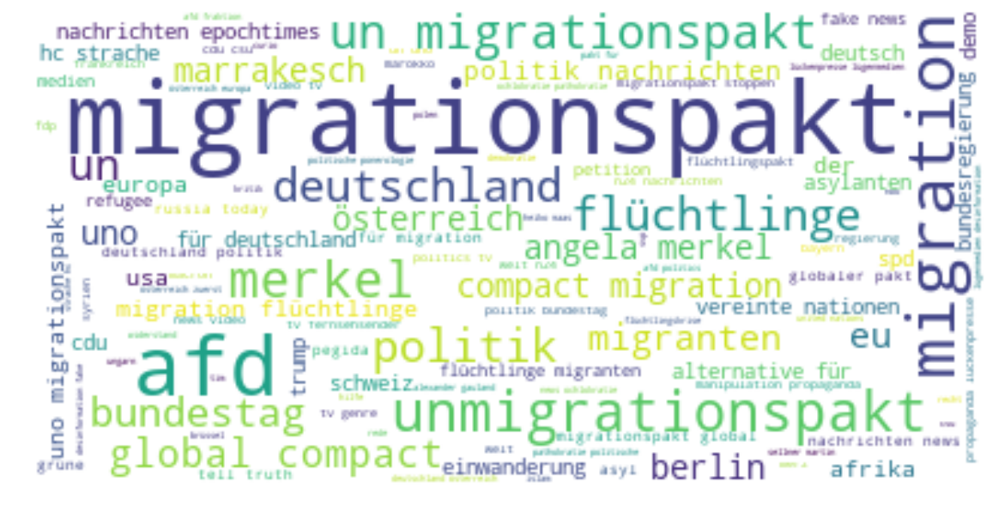

In [449]:
# Set a large enough size of the image
plt.figure(figsize=(20,15))

# Create and generate a word cloud image:
wordcloud = WordCloud(background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## Part 2 - Scrape Recommendations and Analyze weighting

### Get the related Videos

The Aim is to get the most relevant 20 Video Recommendations for each Video ID. Therefore, I created a modified function to the one above, taking IDs instead of Search Queries as an input. 

I am only interested in the first 20 recommended videos, since more are hardly seen at the list of recommendations. The results are then to be sorted by Relevance instead of Date, which was the case for the youtube_search function above.

Thereby, I get IDs of these Videos, in the order, which I assume, would likely pop up, after watching the corresponding video before.

The first function gets me the recommended videos, if I insert a valid video API, the second function takes an entire list as input, reduces the data to only the ID, and gives a dictionary with original ID as key and recommended IDs as value list as an output. This is the initial step to draw a graph later. 

In [716]:
# Input is Video IDs, Number of Recommendations, Relevance and a Marker for the next Iteration step
def youtube_related_search(relatedToVideoId, max_results=20,order="relevance", token=None):  
    
    # Acess Youtube again via API
    youtube = build('youtube', 'v3',
        developerKey=api_key)
    
    # Defining the type of search: Related to Video ID
    search_response = youtube.search().list(
        relatedToVideoId=relatedToVideoId,
        type="video",
        pageToken=token,
        order = order,
        
        #Only taking out the ID
        part="id",
        maxResults=max_results,
        ).execute()
    
    videos = []
    # Exception Handling - relevant for iteration - retreived from (https://github.com/spnichol/youtube_tutorial/blob/master/youtube_videos.py) 
    for search_result in search_response.get("items", []):
        if search_result["id"]["kind"] == "youtube#video":
            videos.append(search_result)
    
    # Go to next portion of 50 Videos
    try:
        nexttok = search_response["nextPageToken"]
        return(nexttok, videos)
    
    # If token has arrived at last page, finish. 
    except Exception as e:
        nexttok = "last_page"
        return(nexttok, videos)

### Using the function in a loop, appending only the ID of the related Video 

This function takes a list of IDs as inputs and returns a dictionary with the original list elements as keys and the recommendations as values.

I am having a hard time with the Google quota limit of 10.000! I even filled out a Google Request for more, but I don't have a lot of hope. Nevertheless, I was to import old scraping results from the beginning of february to do analysis with. I had some trouble with importing as well, due to a mistake in saving the csv, but I managed to work out a dictionary with initial search results as keys and recommendations as values.

In [717]:

#Function to get the most related Videos out of a list of Video IDs.
def related_vids(lst):
    
    #dictionary to be filled with original IDs as Keys and related Videos as Values 
    related_dict = {}
    
    #Iterate over each ID in the original List
    for ident in lst:
        
        #Get the 5 most relevant Videos 
        related_response = youtube_related_search(ident)
        related_work = related_response[1]
        
        #List of all recommended Videos for original List's IDs
        idlist = []
        
        #Iterate over Retreived Data, to only get the Video ID again
        for i in related_work:
            
            # Only get VideoID
            result = i['id']['videoId']
            idlist.append(result)
        
        #Original Video ID in Key, Result in Value.
        new = {ident : idlist}
        related_dict.update(new)
        
    return related_dict



### API problems

At this point, I often failed due to problems with the Youtube API. The limit of 10000 was quickly exceeded, which is why I had to rely on imports from my own pc, resulting from earlier scrapes, I had luckily conducted.

In [719]:
# Saving the dictionary of original IDs and recommended IDs in a dictionary
network_dict = related_vids(truelist)

### Save Ready Dictionary to Dataframe and on PC

Something, that I am really happy, I did some weeks ago! Nevertheless, this format was quite hard to import (see below)

In [87]:
# writing recommendations to csv
with open('network_dict.csv', 'w') as csv_file:
    writer = csv.writer(csv_file)
    for key, value in network_dict.items():
       writer.writerow([key, value])

### Importing the dataset of related Videos

In [499]:
#Storing the csv as a pandas dataframe
imp = pd.read_csv('network_dict.csv', encoding = 'utf-8')

In [500]:
#Giving the dataframe recognizable column names
imp.columns = ['ID', 'Recommended']

In [536]:
# Transform each column of the csv to a list

Recommended = imp['Recommended'].values.tolist()
Original = imp['ID'].values.tolist()

### Reconstructing the Dictionary

Some Problems Appear with the list of Recommended Videos. They are Enlisted in one single String. I have to create a new list by seperating by comma and delete symbols like '\'[]' in the strings.

In [538]:

# Function to make the single quotes to a list
def enlist(lst):
    
    #final list to append to
    quotefree = []
    
    # iterate over every element
    for i in lst:
        
        # append the elements, seperated by comma
        quotefree.append(list(i.split(',')))
    
    return quotefree 

# use the function
Recommended = remove_quotes(Recommended)

### Getting the IDs straight

Now, I need to remove remaining symbols from the quotes. I tried with Regular Expressions, but the problem was, that it always also deleted parts of the ID Numbers. Therefore I constructed this ifelse clause, aiming to get rid of brackets and strings within the strings of ids. Then the imported list finally looked correct

In [721]:

# final list to be appended
whole = []

#iterate over every sublist element
for block in Recommended:
    sublist = []
    for i in block:
        
        #delete quotes
        if '\'' in i and '[' not in i and ']' not in i:
            new = i.replace('\'', '')
        
        #delete brackets and quotes
        elif '[' in i and '\'' in i:
            first = i.replace('\'', '')
            new = first.replace('[', '')
        
        # delete closing brackets and quotes
        elif ']' in i and '\'' in i:
            first = i.replace('\'', '')
            new = first.replace(']', '')
        
        # append to sublist
        sublist.append(new)
    
    #append sublist to final result
    whole.append(sublist)


In [545]:
# Merging the two Lists to a Dictionary, which I finally can work with.

rec_dict = dict(zip(Original, whole))

### Drawing the Directed Graph

I am interested in displaying recommendations of one video to another. Therefore, I use a directed graph, since it shows me the direction of recommendation as well. I rely on the networkx library, which is quite usable for dictionaries of lists, as I have one. The key thereby points to every single list element in the value, which is in my case for every key 20 elements (since I have pulled the 20 most relevant recommendations for each video).

Nodes are single Videos, the directed Edges indicate Recommendations for a certain Video. The edges are alway directed towards the outside. Thanks to NetworkX, also the Recommendations to other initial sarch results are displayed in the image (but of course not visible right now. In the center, we see the initial 550 nodes from the search result and at the periphery, we find 550*20 = 11000 reccomendations, to which the initial videos point to as 'related videos'. It's probably less than 11000, since some videos in the recommended list might have popped up in the initial search result as well. These are indicated as arrows between the nodes in the center of the graph.

Due to the sheer amount of nodes and edges, we can't really see, which video is recommended often and which is not.


We can already see, some assymmetry within this Graph. One Dot at the left of the image seems to attact quite an amount of recommendations from our initial videos. It's the Video with the ID N8I-ljmJ9FI. We will get back to that later.

In [645]:
#Converting my dataset to graph format
graph = nx.from_dict_of_lists(rec_dict, create_using=nx.DiGraph())

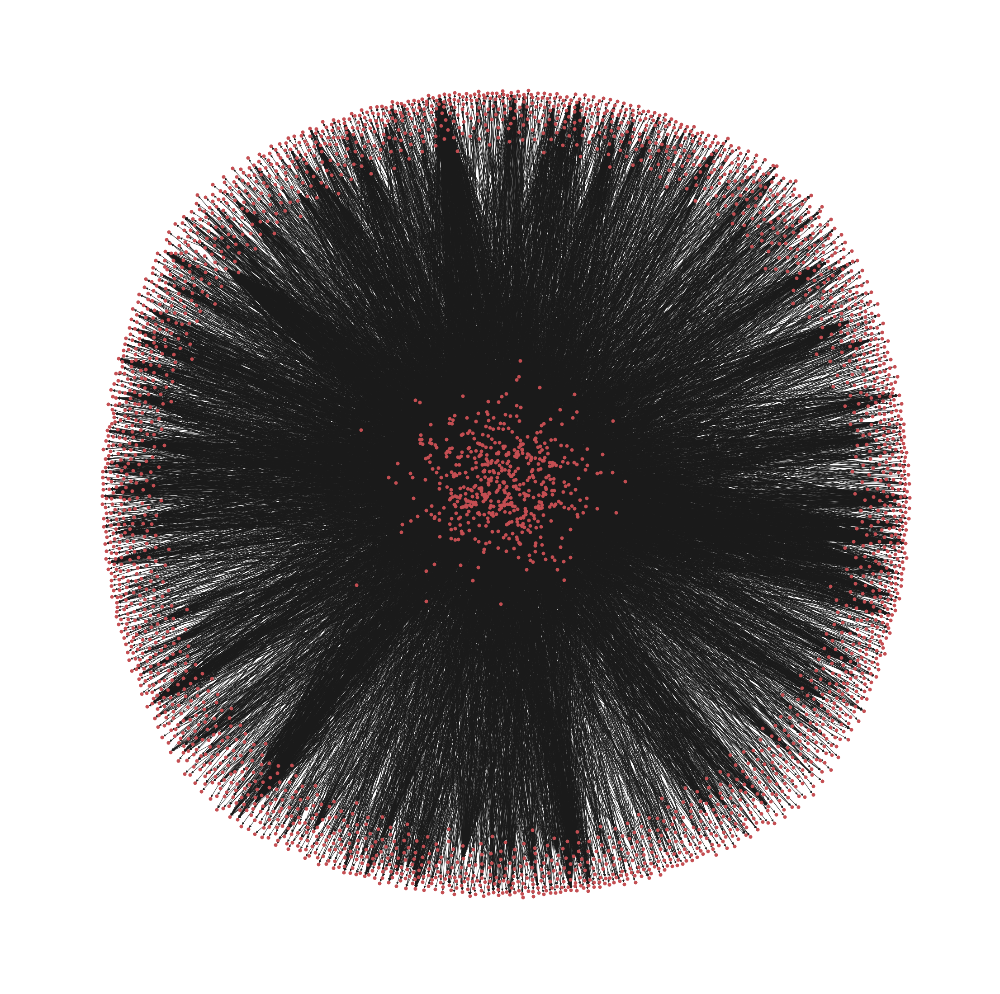

In [603]:
#Getting the correct figure size
plt.figure(figsize=(30, 30))

#Drawing the graph. The node size is standardized in this case. The edges seem to be thick, but actually a single one is quite thin!
nx.draw(graph, node_size = 50, edges = 0.5)
plt.show()

### Getting the number of recommendations per video

Since the initial  graph is quite hard to interpret, is used the in-degree property of networkx, to create a set of recommendations for every single video. in-degree displays the number of arrows going into each edge. It therefore perfectly serves my concern - getting the number of recommendations for a certain video. With that, I can make the node size dependant on the number of recommendations in the next graph, giving me some more space for interpretation. If there is no recommendation, the node is not visible. If there are recommendation, the node has size 10 times the number of recommendations (in the last one, each node had size 50). 

Starting in the center, what we see is, that there are much fewer nodes than in the previous (standardized size) graph. This indicates, that many videos in the initial search result are not recommended even once by any other video in the set. In general it's quite surprising how few recommendations actually point towards initial search results. A vast majority points to other videos, indicated at the periphery of the grahp. Thereby we can see quite powerful nodes, indicating a large number of recommendations. Nevertheless, these videos have not popped up in the initial search result.

In [646]:
# Getting the number of recommendations per video into a set of tuples
d = graph.in_degree()

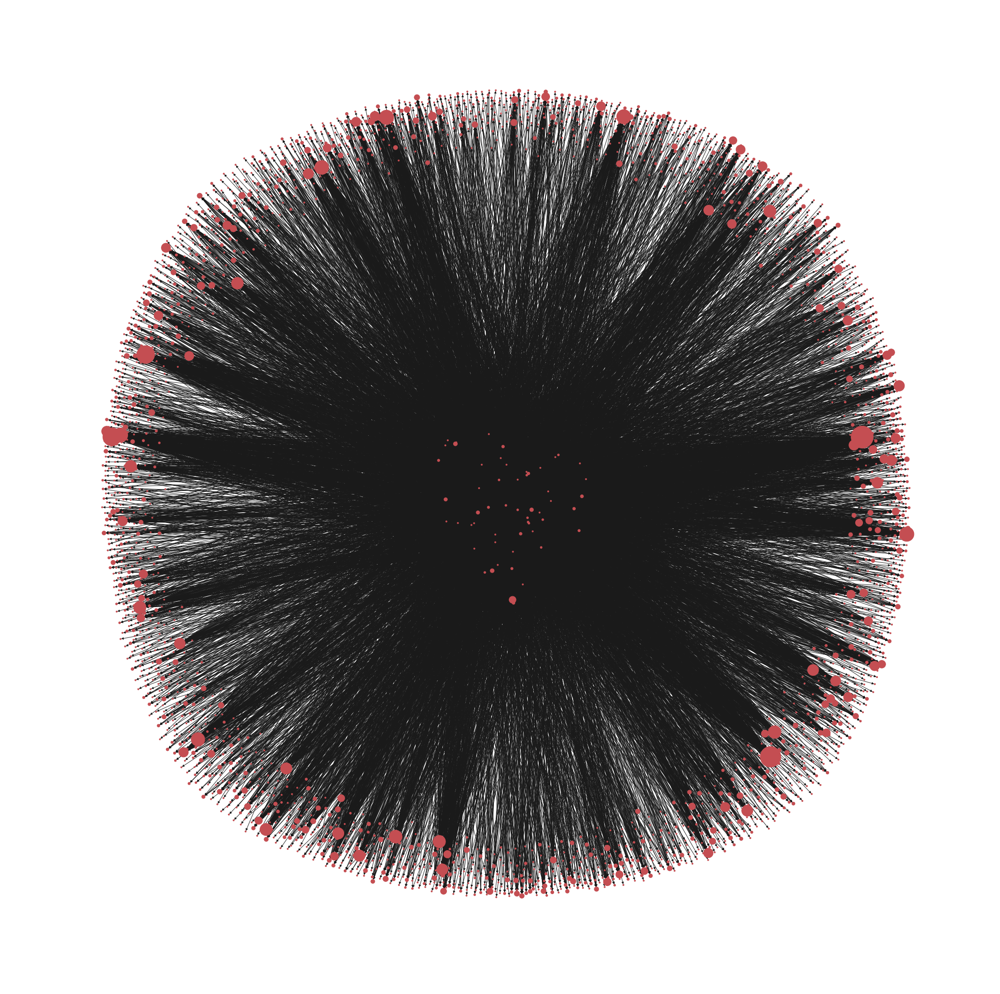

In [590]:
# Plotting the Graph

plt.figure(3, figsize=(30, 30))

nx.draw(graph, node_size=[v * 10 for k, v in d])
plt.show()

### Covering the exact Distribution of Recommendations per Video

Even though the graph looks nice, it gives no satisfying objective information about the exact distribution of recommendations among all videos. Therefore, I collected the tuple-set into a list to display the frequency of videos, depending on its number of recommendations in a histogram.

In the result we can see, that the overwhelming majority gets recommended fewer than 5 times, whereas we have more than half a dozen videos, being recommended in more than 100 cases! Quite an assymmetry!

In [655]:
# Collection List for the single tuples to be appended
full_collect_in_degree = []

# Iterate over every tuple to append it to the list
for i in d:
    full_collect_in_degree.append(i)

In [656]:
# Transform the result to pd Dataframe for analysis

#pre-transform to dictionary
value_dict = {'Recommendations': [n[1] for n in full_collect_in_degree]}

#transform to pandas dataframe
degree_vals = pd.DataFrame(value_dict)


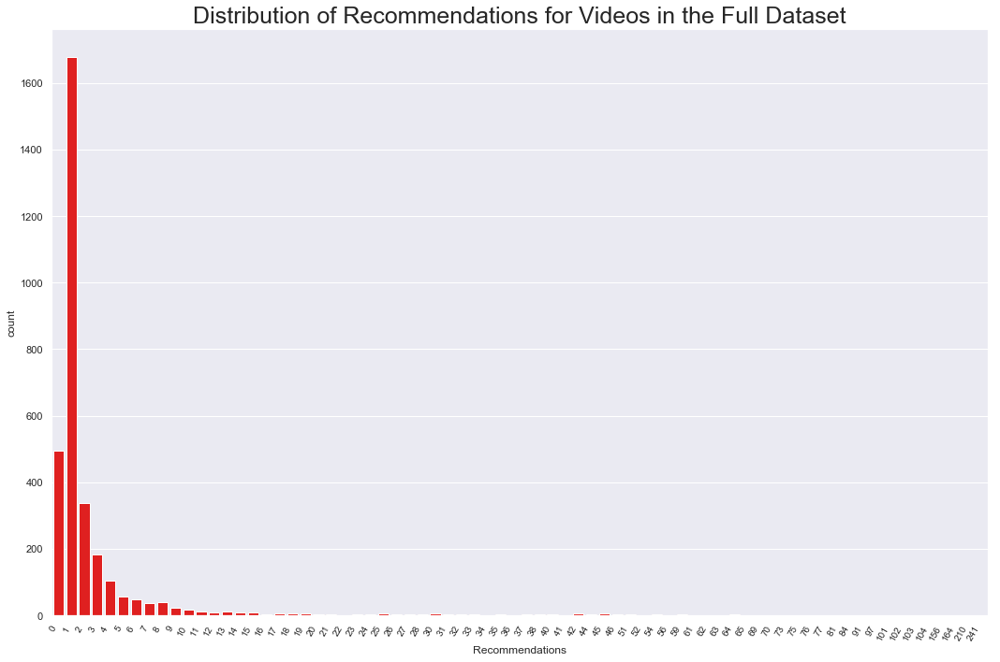

In [657]:
# setup size and style
plt.figure(figsize=(15,10))
sns.set(style="darkgrid")

# plot by number of videos, sort bars by increasing recommendations
ax = sns.countplot(x='Recommendations',color = 'red', data=degree_vals)

# change angle of x labels
ax.set_xticklabels(ax.get_xticklabels(minor = True, which = 'both'), rotation=60, ha="right", fontsize = 10)
ax.set_title('Distribution of Recommendations for Videos in the Full Dataset', fontsize = 25)

# Display the plot
plt.tight_layout()
plt.show()

### New Graph - reduced to the first recommendation

Since the Structure of the previous Graphs was quite hard to understand, I reduced the recommended Videos to the one most relevant (the Video IDs are sorted by Relevance due to the function they were scraped with). I assume, that the one most relevant, is also the one being autoplayed after the previous Video had been watched to the end. Therefore, this would also be the one, which is most likely watched next.

The weight of nodes is multiplied by 100 for each recommendation in the graph below. Also here - in a highly reduced environment of recommendations, we still get the impression of quite an assymmetric distribution of recommendations. Surprisingly, only few initial nodes are actually visible (they can be recognized by having an arrow going not only into them, but also out of them).

###### Collecting only the first Video ID out of every recommendation list

In [587]:
# Final Dictionary to append the videos to
reduced = {}

#Iterate over each pair in the recommendation - dict of lists
for k,v in rec_dict.items():
    
    # get the first element, append it to dict with original key as key
    new = {k: [v[0]]}
    
    # update final dictionary
    reduced.update(new)

In [598]:
# Convert the new dataset to a directed graph
reduced_graph = nx.from_dict_of_lists(reduced, create_using=nx.DiGraph())

In [599]:
d_reduced = reduced_graph.in_degree()

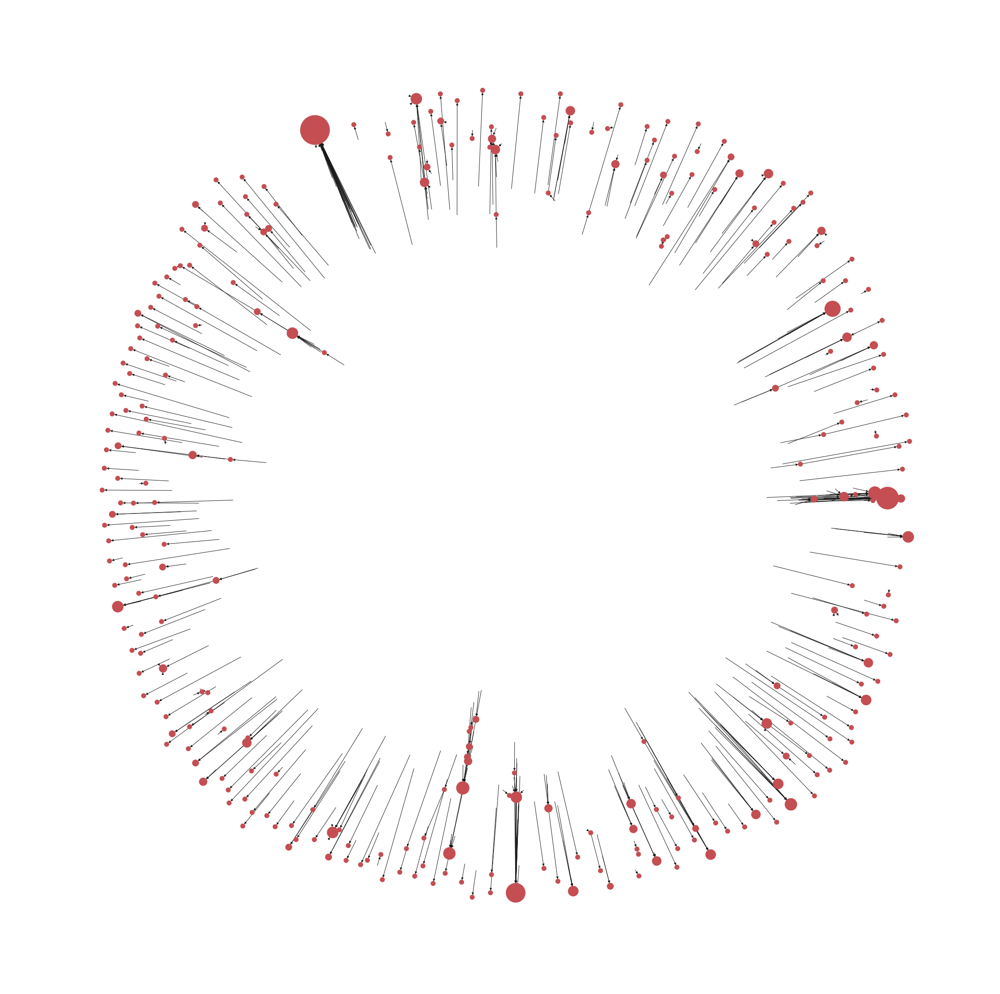

In [601]:
plt.figure(3, figsize=(30, 30))

nx.draw(reduced_graph, node_size=[v * 100 for k, v in d_reduced])
plt.show()

### Covering the exact Distribution of Recommendations per Video

The graph is interesting, but again not substantial, which is why I also display the distribution of recommendations in a frequency plot. Thereby, the top video (42 Recommendations) has quite a large weight. The majority of zero recommendations becomes obvious, since the proportion of initial search results (are the only ones, that actually remain unrecommended) takes more than 50%.

In [658]:
# Collection List for the single tuples to be appended
collect_in_degree = []

# Iterate over every tuple to append it to the list
for i in d_reduced:
    collect_in_degree.append(i)

In [659]:
# Transform the result to pd Dataframe for analysis

#pre-transform to dictionary
value_dict = {'Recommendations': [n[1] for n in collect_in_degree]}

#transform to pandas dataframe
degree_vals = pd.DataFrame(value_dict)


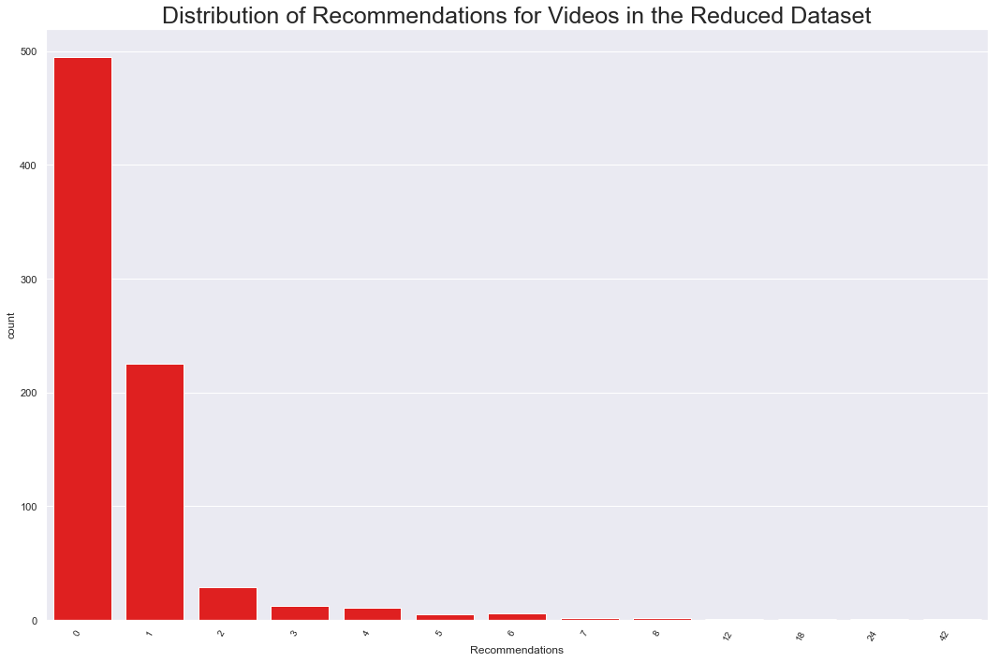

In [660]:
#setup size and style
plt.figure(figsize=(15,10))
sns.set(style="darkgrid")

# plot by amount of videos, sort bars by increasing recommendations
ax = sns.countplot(x='Recommendations',color = 'red', data=degree_vals)

# change angle of x labels
ax.set_xticklabels(ax.get_xticklabels(minor = True, which = 'both'), rotation=60, ha="right", fontsize = 10)
ax.set_title('Distribution of Recommendations for Videos in the Reduced Dataset', fontsize = 25)

# Display the plot
plt.tight_layout()
plt.show()

## Part 3 - Further Attempts / Outlook 

The next steps, which I find most interesting to be analyzed are: 
1.)The content of highly recommended videos vs the content of not so highly recommended videos
2.)The relationship of video recommendations, once we also ask for recommendations of the new level (and the level below and so forth)
3.)The general tendency of recommendations to a certain content

Nevertheless, they only can serve as an outlook here, since there were some problems, executing the functions.

### Drawing information from recommended videos 

I build a function, taking 2-tuples of (id,recommendations) as input, requesting for data of the respective video, cleaning the incoming data already cleaned for analysis, using my 'order_vids()' function from the datacleaning above.
The output is a list of 2-tuples with clean video information and the number of recommendations. 

With this, I can analyze, if likes, views or comments stand in any relationship to the number a video gets recommended.

In [ ]:
# Conversion of the recommendations list to pandas for analysis
pd_large_recommendations = pd.DataFrame(recom_list)

In [ ]:
# Storing freshly scraped data locally

#with open('nested_recommendations', 'w') as fout:
#    json.dump(recom_list, fout)

#pd_large_recommendations.to_pickle('Recommendations_pd')

In [30]:
# Getting Dictionary Data for recommendations from storage
with open('Data/nested_recommendations', 'r', encoding = 'utf-8') as f:
    nested2 = json.load(f)

In [29]:
# Getting the pandas df from storage
df = pd.read_pickle('Data/Recommendations_pd')

In [ ]:
# After conversion to pandas df I store the df locally as a pickle. 
pd_large_recommendations = pd.DataFrame(recom_list)

In [9]:
# Convert the imported data to original names

recom_list = nested2

pd_large_recommendations = df

In [737]:
# function to get information out of single IDs, taking 2-tuple as input
def draw_info (lst):
    # Final List for (Content, #Recommendation) - units to be appended to
    response_list = []
    
    # Iterate over each element in list
    for elem in lst:
        
        # Get the same information as above for each code, which is always the first out of every 2 - element set
        video_response = [youtube.videos().list(
        id=elem[0],
        part='snippet,contentDetails,statistics'
        ).execute()]
        
        # Enlisting one new block in the set, containing info and the number of recommendations
        group = [order_vids(video_response), elem[1]]
        
        # append to initial list
        response_list.append(group)
    
    return response_list

In [747]:
# Reducing the of videos to the ones, recommended at least once
recommended_min_once_recuced = []
for i in collect_in_degree:
    if i[1] > 0:
        recommended_min_once_recuced.append(i)

In [ ]:
# Executing the function on the reduced list - I might need to do some more exception handling
second_level_info = draw_info(recommended_min_once_recuced)


In [ ]:
large_recommendations = sorted(second_level_info, key = lambda x: x[1], reverse = True)

In [ ]:
for i in large_recommendations:
    print(i[1], '|',i[0][0]['Video Title'], '|', i[0][0]['Views'])

In [ ]:
#Write a Function to clean the retreived list of youtube descriptions
def order_vids_reccom(inp):
    #final list for results to be appended
    reccomend_list=[]
    
    #iterate over earch element in retreived list
    for i in inp:
        
        #create new dictionary to be filled with values below and appended to final list
        parse_dict = {}
        
        # get the video title
        parse_dict['Video Title'] = i[0][0]['Video Title']
        
        # get the video description - a longer text under each Video
        parse_dict['Video Description'] = i[0][0]['Video Description']
        
        # get the video duration in seconds
        parse_dict['Duration']= i[0][0]['Duration']
        
        # get the Id number also into this dataframe
        parse_dict['Video Id']= i[0][0]['Video Id']
        
        # get the video category. Youtube categorizes its videos by topic
        parse_dict['Category'] = i[0][0]['Category']
        
        # get the channel title
        parse_dict['Channel Title'] = i[0][0]['Channel Title']
        
        # get the channel Id
        parse_dict['Channel Id'] = i[0][0]['Channel Id']
        
        # get the date of publication
        parse_dict['Published Day'] = i[0][0]['Published Day']
        
        # get the month of publication
        parse_dict['Published Month'] = i[0][0]['Published Month']
        
        # get the week of publication
        parse_dict['Published Week'] = i[0][0]['Published Week']
        
        # get the weekday and hour of publication
        parse_dict['Published Time'] = i[0][0]['Published Time']
        
        # get the number of views in integer format
        parse_dict['Views'] = i[0][0]['Views']
        
        #get the number of comments in integer format

        parse_dict['Comments Count'] = i[0][0]['Comments Count']
        
        #get the number of likes in integer format

        parse_dict['Likes Count'] = i[0][0]['Likes Count']
        
        #get the number of dislikes in integer format

        parse_dict['Dislikes Count'] = i[0][0]['Dislikes Count']
        
        #get the list of tags for each video

        parse_dict['Tags'] = i[0][0]['Tags']
        
        # get the number of recommendations
        
        parse_dict['Recommendations'] = int(i[1])
            
        #append all results to the final list
        reccomend_list.append(parse_dict)
    
    return reccomend_list

In [ ]:
# At this point, I have stored the files locally on my drive.
recom_list = order_vids_reccom(large_recommendations)

### Do some basic analysis of video attributes and recommendations
Now I can investigate, if there is any relationship between views, likes, comments and the number of recommendations. As shown below, the relationship is quite weak.

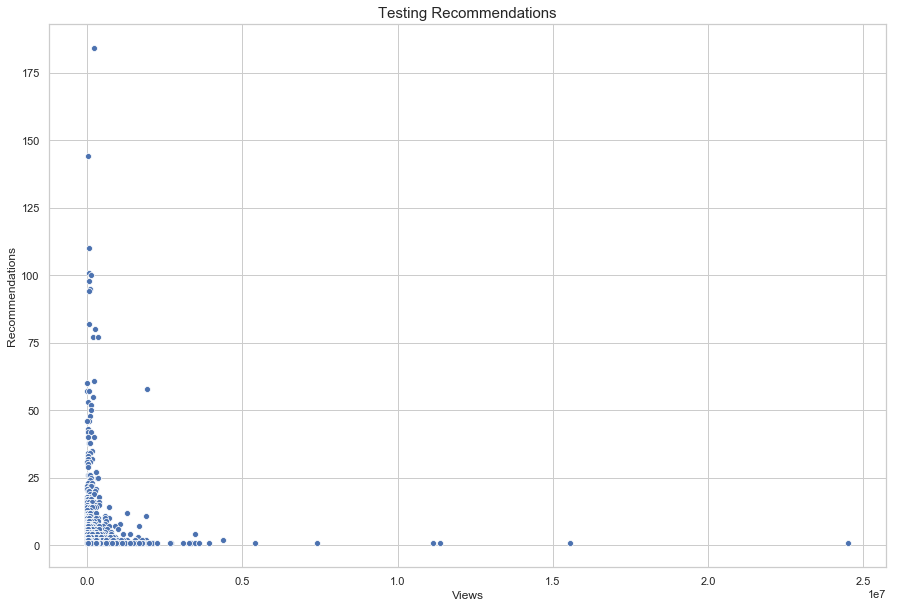

In [11]:
# Setup two rows of plots and a large figure size
fig, axs = plt.subplots(1,1, figsize=(15,10))

#create the first scatterplot with likes by views
ax = sns.scatterplot(x = 'Views', y = 'Recommendations', data = pd_large_recommendations)
ax.set_title('Testing Recommendations', fontsize = 15)

#create the second scatterplot with comments by views
#ax1 = sns.scatterplot(x = 'Views', y = 'Comments Count', data = newset_pd, ax = axs[1])
#ax1.set_title('Comments by Views', fontsize = 15)

#display the plot
plt.show()

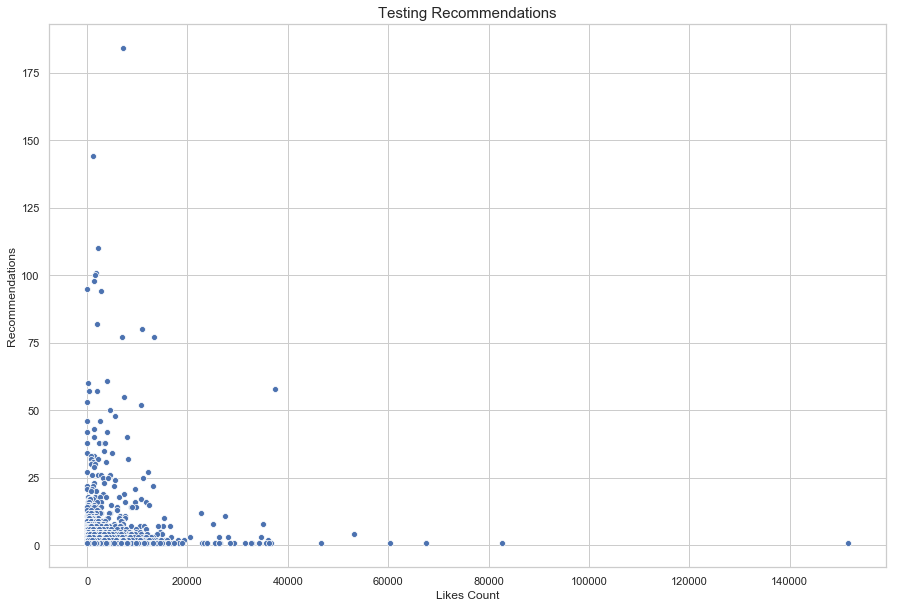

In [13]:
# Setup two rows of plots and a large figure size
fig, axs = plt.subplots(1,1, figsize=(15,10))

#create the first scatterplot with likes by views
ax = sns.scatterplot(x = 'Likes Count', y = 'Recommendations', data = pd_large_recommendations)
ax.set_title('Testing Recommendations', fontsize = 15)

#create the second scatterplot with comments by views
#ax1 = sns.scatterplot(x = 'Views', y = 'Comments Count', data = newset_pd, ax = axs[1])
#ax1.set_title('Comments by Views', fontsize = 15)

#display the plot
plt.show()

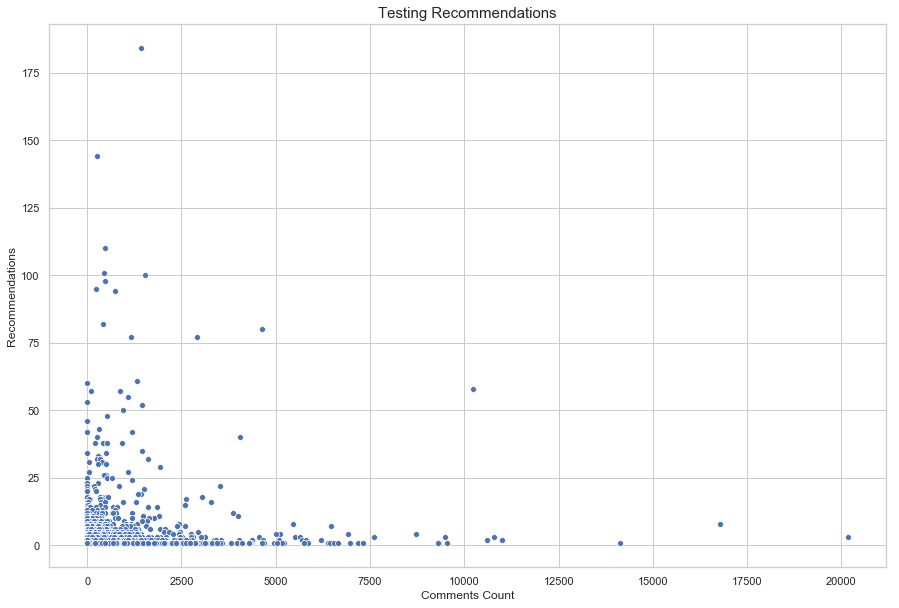

In [12]:
# Setup two rows of plots and a large figure size
fig, axs = plt.subplots(1,1, figsize=(15,10))

#create the first scatterplot with likes by views
ax = sns.scatterplot(x = 'Comments Count', y = 'Recommendations', data = pd_large_recommendations)
ax.set_title('Testing Recommendations', fontsize = 15)

#create the second scatterplot with comments by views
#ax1 = sns.scatterplot(x = 'Views', y = 'Comments Count', data = newset_pd, ax = axs[1])
#ax1.set_title('Comments by Views', fontsize = 15)

#display the plot
plt.show()

## Further goals: 
- Train an algorithm to categorize video descriptions via unsupervised learning libraries.
- Examine the relationship between categories and number of recommendations.
- Establish a daily data request by a server on the api.
- Extend the chain of video-recommendations from currently one to ten or fifteen (simulate youtube-marathons)